In [ ]:
import torch
from torchvision import transforms
from PIL import Image
from torchvision.models.segmentation import fcn_resnet50
from torchvision.models.segmentation.fcn import FCNHead
import torch.utils.data as data
import glob
import os
import numpy as np 
from google.colab.patches import cv2_imshow
import time
from tqdm import tqdm
import cv2
import torch.nn as nn
import matplotlib.pyplot as plt
import requests
from io import BytesIO
from torch.autograd import Variable
from torchvision.models.segmentation.fcn import FCNHead
import torch.optim as optim

# Load images

In [ ]:
!unzip /content/drive/MyDrive/segmentation_data/images_and_masks3b.zip -d /content/UNIMIB2016_images

In [ ]:
img_size = (136,102)

# Create class for dataset
class SegmentationDataset(data.Dataset):
  
  def __init__(self, folder_path):
    super(SegmentationDataset, self).__init__()
    self.img_files = glob.glob(os.path.join(folder_path,'image','*.jpg'))
    self.mask_files = []
    for img_path in self.img_files:
      self.mask_files.append(os.path.join(folder_path,'mask_zero_one2',os.path.basename(img_path)))

  def __getitem__(self, index):
    img_path = self.img_files[index]
    mask_path = self.mask_files[index]
    data = np.asarray(Image.open(img_path).resize(img_size))
    label = np.asarray(Image.open(mask_path).resize(img_size)) 
    return torch.from_numpy(data).float().permute(2,1,0), torch.from_numpy(label).float().permute(1, 0).unsqueeze(0)

  def __len__(self):
    return len(self.img_files)


In [ ]:
food_data = SegmentationDataset('/content/UNIMIB2016_images')

# Split in train and test
LENGTH_TRAIN = 770
LENGTH_TEST = 1027-770
train_dataset, test_dataset = data.random_split(food_data, [LENGTH_TRAIN, LENGTH_TEST])

batch_size = 32
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=1027-770)

data_iter_train = iter(train_dataloader)
images_train, labels_train = data_iter_train.next()

data_iter_test = iter(test_dataloader)
images_test, labels_test = data_iter_test.next()

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
images_test, labels_test = images_test.to(device), labels_test.to(device)
images_test, labels_test = Variable(images_test), Variable(labels_test)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)


# Create model

In [ ]:
num_classes = 1 # food or no food

model = fcn_resnet50(pretrained=True, progress=False)

for param in model.parameters():
        param.requires_grad = False

model.classifier = FCNHead(2048, num_classes)
model.aux_classifier = FCNHead(1024, num_classes)

criterion = nn.BCELoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay = 1e-3)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Training

In [ ]:
num_epoch = 7

model.train()

loss_history_train = []
loss_history_test = []

for epoch in range(num_epoch):  # loop over the dataset multiple times
    print('Epoch: ', epoch)

    running_loss = 0.0
    for i, data_train in enumerate(train_dataloader, 0):
        # get the inputs
        inputs_train, labels_train = data_train

        inputs_train, labels_train = inputs_train.to(device), labels_train.to(device)

        # wrap them in Variable
        inputs_train, labels_train = Variable(inputs_train), Variable(labels_train)

        # zero the parameter gradients
        optimizer.zero_grad()
        
        # forward + backward + optimize
        outputs_train = model(inputs_train)
        out_train = torch.sigmoid(outputs_train['out'])
        loss_train = criterion(out_train,labels_train)
        loss_train.backward()
        optimizer.step()

        # test loss
        outputs_test = model(images_test)
        out_test = torch.sigmoid(outputs_test['out'])
        loss_test = criterion(out_test,labels_test)

        # print statistics
        loss_history_train.append(loss_train.item())
        loss_history_test.append(loss_test.item())
        running_loss += loss_train.data
        if i % 1000 == 999:    # print every 1000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 1000))
            running_loss = 0.0

print('Finished Training')

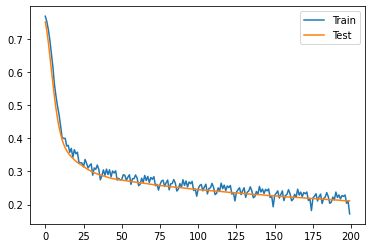

In [ ]:
plt.plot(loss_history_train)
plt.plot(loss_history_test)
plt.legend(['Train','Test'])
plt.show()

# Results

## Train set (UNIMIB2016)

In this section we check how the model works for the images it has been trained on

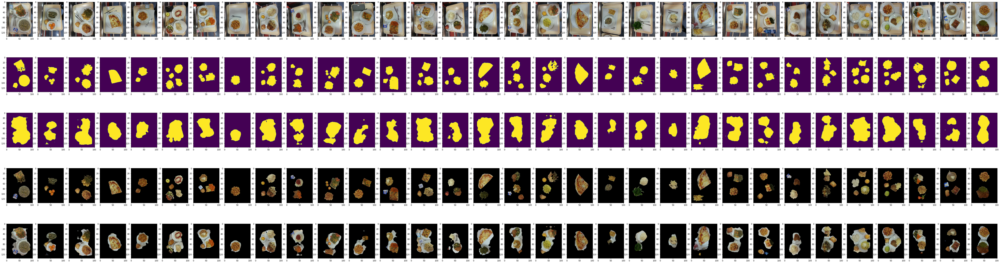

In [ ]:
images_train, labels_train = data_iter_train.next()

model.eval()

def torch_to_image(tensor):
  image = tensor.permute(0,2,3,1).squeeze().cpu().numpy()

  return image
  # return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

images_train_numpy = torch_to_image(images_train)
labels_train_numpy = torch_to_image(labels_train)

outputs = model(images_train.to(device))
output_sigmoid = torch.sigmoid(outputs['out'])
output_sigmoid_binary = output_sigmoid > 0.20
output_sigmoid_binary_numpy = torch_to_image(output_sigmoid_binary)

real_segmentation = np.multiply(images_train_numpy,labels_train_numpy[..., np.newaxis])
predicted_segmentation = np.multiply(images_train_numpy,output_sigmoid_binary_numpy[..., np.newaxis])

fig, ax = plt.subplots(5, batch_size,figsize=(90, 25))

# original image
for j, axes in enumerate(ax[0]):
  axes.imshow(images_train_numpy[j]/255)

# real mask
for j, axes in enumerate(ax[1]):
  axes.imshow(labels_train_numpy[j]/255)

# predicted mask
for j, axes in enumerate(ax[2]):
  axes.imshow(output_sigmoid_binary_numpy[j]/255)

# real segmented image
for j, axes in enumerate(ax[3]):
  axes.imshow(real_segmentation[j]/255)

# predicted segmented image
for j, axes in enumerate(ax[4]):
  axes.imshow(predicted_segmentation[j]/255)

fig.show()

## Test set (UNIMIB2016)

In this section we check how the model works for unseen images of the same dataset used for training

In [ ]:
test_dataloader_for_testing = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)
data_iter_test_for_testing = iter(test_dataloader_for_testing)

In [ ]:
images_test_testing, labels_test_testing = data_iter_test_for_testing.next()

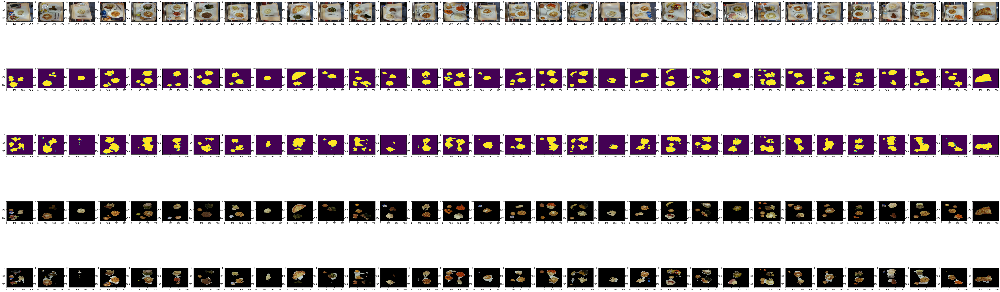

In [ ]:
model.eval()

def torch_to_image(tensor):
  image = tensor.permute(0,2,3,1).squeeze().cpu().numpy()

  return image
  # return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

images_test_numpy = torch_to_image(images_test_testing)
labels_test_numpy = torch_to_image(labels_test_testing)

outputs = model(images_test_testing.to(device))
output_sigmoid = torch.sigmoid(outputs['out'])
output_sigmoid_binary = output_sigmoid > 0.3
output_sigmoid_binary_numpy = torch_to_image(output_sigmoid_binary)

real_segmentation = np.multiply(images_test_numpy,labels_test_numpy[..., np.newaxis])
predicted_segmentation = np.multiply(images_test_numpy,output_sigmoid_binary_numpy[..., np.newaxis])

fig, ax = plt.subplots(5, batch_size,figsize=(90, 30))

# original image
for j, axes in enumerate(ax[0]):
  axes.imshow(images_test_numpy[j]/255)

# real mask
for j, axes in enumerate(ax[1]):
  axes.imshow(labels_test_numpy[j]/255)

# predicted mask
for j, axes in enumerate(ax[2]):
  axes.imshow(output_sigmoid_binary_numpy[j]/255)

# real segmented image
for j, axes in enumerate(ax[3]):
  axes.imshow(real_segmentation[j]/255)

# predicted segmented image
for j, axes in enumerate(ax[4]):
  axes.imshow(predicted_segmentation[j]/255)

fig.show()


## COPSAC2000 data

In this section we check how the model works in a sample of the dataset we want to segment.

### Load images

In [ ]:
!unzip /content/drive/MyDrive/segmentation_data/segmentation_copsac.zip -d /content/images_copsac

In [ ]:
img_size = (240,320)

class SegmentationDatasetCOPSAC(data.Dataset):
  
  def __init__(self, folder_path):
    super(SegmentationDatasetCOPSAC, self).__init__()
    self.img_files = glob.glob(os.path.join(folder_path,'segmentation_copsac','*'))

  def __getitem__(self, index):
    img_path = self.img_files[index]
    image = np.asarray(Image.open(img_path).resize(img_size))

    if len(image.shape) > 2 and image.shape[2] == 4:
    #if the image is .png (has 4 channels) convert the image from RGBA2RGB
      image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)

    return torch.from_numpy(image).float().permute(2,1,0)

  def __len__(self):
    return len(self.img_files)

In [ ]:
copsac_data = SegmentationDatasetCOPSAC('/content/images_copsac/')

batch_size = 32
copsac_dataloader = torch.utils.data.DataLoader(copsac_data, batch_size=batch_size)

data_iter_copsac = iter(copsac_dataloader)

### Results

We see them for several batches this time.

#### Batch 1 

In [ ]:
copsac_train = data_iter_copsac.next()

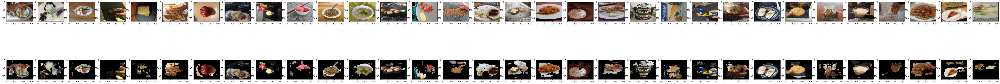

In [ ]:
model.eval()

def torch_to_image(tensor):
  image = tensor.permute(0,2,3,1).squeeze().cpu().numpy()

  return image
  # return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

images_test_numpy = torch_to_image(copsac_train)

outputs = model(copsac_train.to(device))
output_sigmoid = torch.sigmoid(outputs['out'])
output_sigmoid_binary = output_sigmoid > 0.15
output_sigmoid_binary_numpy = torch_to_image(output_sigmoid_binary)

predicted_segmentation = np.multiply(images_test_numpy,output_sigmoid_binary_numpy[..., np.newaxis])

fig, ax = plt.subplots(2, batch_size,figsize=(90, 10))

# original image
for j, axes in enumerate(ax[0]):
  axes.imshow(images_test_numpy[j]/255)

# predicted segmented image
for j, axes in enumerate(ax[1]):
  axes.imshow(predicted_segmentation[j]/255)

fig.show()

#### Batch 2

In [ ]:
copsac_train = data_iter_copsac.next()

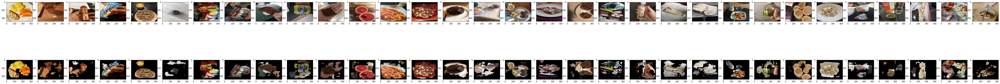

In [ ]:
model.eval()

def torch_to_image(tensor):
  image = tensor.permute(0,2,3,1).squeeze().cpu().numpy()

  return image
  # return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

images_test_numpy = torch_to_image(copsac_train)

outputs = model(copsac_train.to(device))
output_sigmoid = torch.sigmoid(outputs['out'])
output_sigmoid_binary = output_sigmoid > 0.15
output_sigmoid_binary_numpy = torch_to_image(output_sigmoid_binary)

predicted_segmentation = np.multiply(images_test_numpy,output_sigmoid_binary_numpy[..., np.newaxis])

fig, ax = plt.subplots(2, batch_size,figsize=(90, 10))

# original image
for j, axes in enumerate(ax[0]):
  axes.imshow(images_test_numpy[j]/255)

# predicted segmented image
for j, axes in enumerate(ax[1]):
  axes.imshow(predicted_segmentation[j]/255)

fig.show()

#### Batch 3

In [ ]:
copsac_train = data_iter_copsac.next()

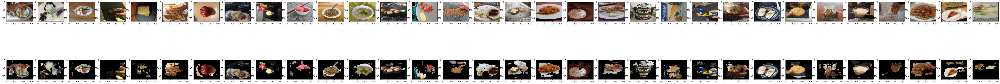

In [ ]:
model.eval()

def torch_to_image(tensor):
  image = tensor.permute(0,2,3,1).squeeze().cpu().numpy()

  return image
  # return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

images_test_numpy = torch_to_image(copsac_train)

outputs = model(copsac_train.to(device))
output_sigmoid = torch.sigmoid(outputs['out'])
output_sigmoid_binary = output_sigmoid > 0.15
output_sigmoid_binary_numpy = torch_to_image(output_sigmoid_binary)

predicted_segmentation = np.multiply(images_test_numpy,output_sigmoid_binary_numpy[..., np.newaxis])

fig, ax = plt.subplots(2, batch_size,figsize=(90, 10))

# original image
for j, axes in enumerate(ax[0]):
  axes.imshow(images_test_numpy[j]/255)

# predicted segmented image
for j, axes in enumerate(ax[1]):
  axes.imshow(predicted_segmentation[j]/255)

fig.show()

## Images from internet

In [ ]:
# paste the url of the desired picture
url = 'https://c.pxhere.com/photos/ab/53/restaurant_gastronomy_eat_table_chairs_cover-721130.jpg!d'
response = requests.get(url)
img = Image.open(BytesIO(response.content))

img = np.asarray(img.resize(img_size))
img = torch.from_numpy(img).float().permute(2,1,0)
img = img.unsqueeze(0)

In [ ]:
images_test_numpy = torch_to_image(img)

model.eval()

outputs = model(img.to(device))
output_sigmoid = torch.sigmoid(outputs['out'])
output_sigmoid_binary = output_sigmoid > 0.3
output_sigmoid_binary_numpy = torch_to_image(output_sigmoid_binary)

predicted_segmentation = np.multiply(images_test_numpy,output_sigmoid_binary_numpy[..., np.newaxis])

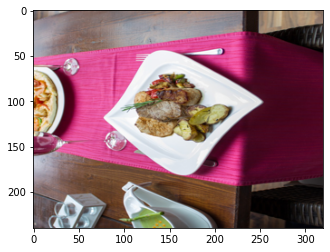

In [ ]:
plt.imshow(images_test_numpy/255)

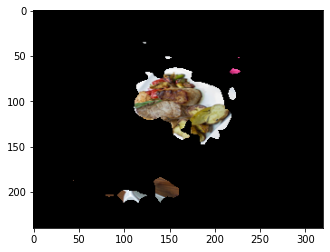

In [ ]:
plt.imshow(predicted_segmentation/255)

# Final COPSAC segmentation

In this step we run the segmentation on the whole dataset and save the pictures

In [ ]:
!unzip /content/drive/MyDrive/segmentation_data/images-v1.zip -d /content/images-v1

In [ ]:
# Remove corrupted images
path_remove = ['/content/images-v1/104/Scannet_20170615-1831.jpg',
               '/content/images-v1/44/Scannet_20180624-1447.jpg',
               '/content/images-v1/44/Scannet_20180619-1034.jpg',
               '/content/images-v1/44/Scannet_20180618-1723.jpg',
               '/content/images-v1/127/Scannet_20180207-1136.jpg',
               '/content/images-v1/32/Scannet_20181023-1228.jpg',
               '/content/images-v1/32/Scannet_20181024-1641.jpg']

for a in path_remove:
  os.remove(a)

In [ ]:
# Redefine dataset class because of different folder structure
img_size = (240,320)

class SegmentationDatasetCOPSAC(data.Dataset):
  
  def __init__(self, folder_path):
    super(SegmentationDatasetCOPSAC, self).__init__()
    self.img_files = glob.glob(os.path.join(folder_path,'*/*'))

  def __getitem__(self, index):
    img_path = self.img_files[index]
    # print(img_path)
    image = np.asarray(Image.open(img_path).resize(img_size))

    if len(image.shape) > 2 and image.shape[2] == 4:
    #if the image is .png (has 4 channels) convert the image from RGBA2RGB
      image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)

    return torch.from_numpy(image).float().permute(2,1,0), img_path

  def __len__(self):
    return len(self.img_files)

In [ ]:
copsac_data = SegmentationDatasetCOPSAC('/content/images-v1/')

batch_size = 64
copsac_dataloader = torch.utils.data.DataLoader(copsac_data, batch_size=batch_size)

data_iter_copsac = iter(copsac_dataloader)

Segment and save images

In [ ]:
model.eval()

def torch_to_image(tensor):
  image = tensor.permute(0,2,3,1).squeeze().cpu().numpy()

  return image
  # return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

destination_folder = '/content/COPSAC_segmented_4'


for i, copsac_data in enumerate(copsac_dataloader, 0):

  copsac_images, copsac_paths = copsac_data

  images_test_numpy = torch_to_image(copsac_images)

  outputs = model(copsac_images.to(device))
  output_sigmoid = torch.sigmoid(outputs['out'])
  output_sigmoid_binary = output_sigmoid > 0.12
  output_sigmoid_binary_numpy = torch_to_image(output_sigmoid_binary)

  predicted_segmentation = np.multiply(images_test_numpy,output_sigmoid_binary_numpy[..., np.newaxis])

  for k, seg_img in enumerate(predicted_segmentation):
    im = Image.fromarray(seg_img.astype(np.uint8))

    segmentation_path = os.path.join(destination_folder,copsac_paths[k].split(os.sep)[-2:][0],copsac_paths[k].split(os.sep)[-2:][1])

    if not os.path.exists(os.path.dirname(segmentation_path)):
      os.makedirs(os.path.dirname(segmentation_path))

    im.save(segmentation_path)

  # fig, ax = plt.subplots(2, batch_size,figsize=(90, 10))

  # # original image
  # for j, axes in enumerate(ax[0]):
  #   axes.imshow(images_test_numpy[j]/255)
  #   axes.set_title(img_paths[j][-16:])

  # # predicted segmented image
  # for j, axes in enumerate(ax[1]):
  #   axes.imshow(predicted_segmentation[j]/255)
  #   axes.set_title(img_paths[j][-16:])

  # fig.show()


In [ ]:
# zip images
!zip -r '/content/COPSAC_segmented_4.zip' '/content/COPSAC_segmented_4'

# Save model

In [ ]:
# To save model:
torch.save(model.state_dict(), '/content/drive/MyDrive/Deep_learning_Project/Javi/Segmentation notebooks/models/model_12epoch_b')

# To load the model:

  # 1 - Create model from scratch again
  # 2 - model.load_state_dict(torch.load(PATH))

# model.load_state_dict(torch.load('/content/drive/MyDrive/Deep_learning_Project/Javi/Segmentation notebooks/models/model_12epoch'))